In [78]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [79]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from nerfstudio.cameras.cameras import Cameras, CAMERA_MODEL_TO_TYPE
from image_restoration.corruption.ocean import *
from image_restoration.common import ASSETS_DIR

In [80]:
M = 2048 # resolution
N = 2048
Lx = 64 # patch size (m)
Lz = 64
wind = torch.tensor([20, 20]).float() # wind vector (m/s)
t = 0 # time
patch = generate_ocean_patch(Lx, Lz, M, N, wind, t=t, wind_alignment=6, wave_dampening=0.05)

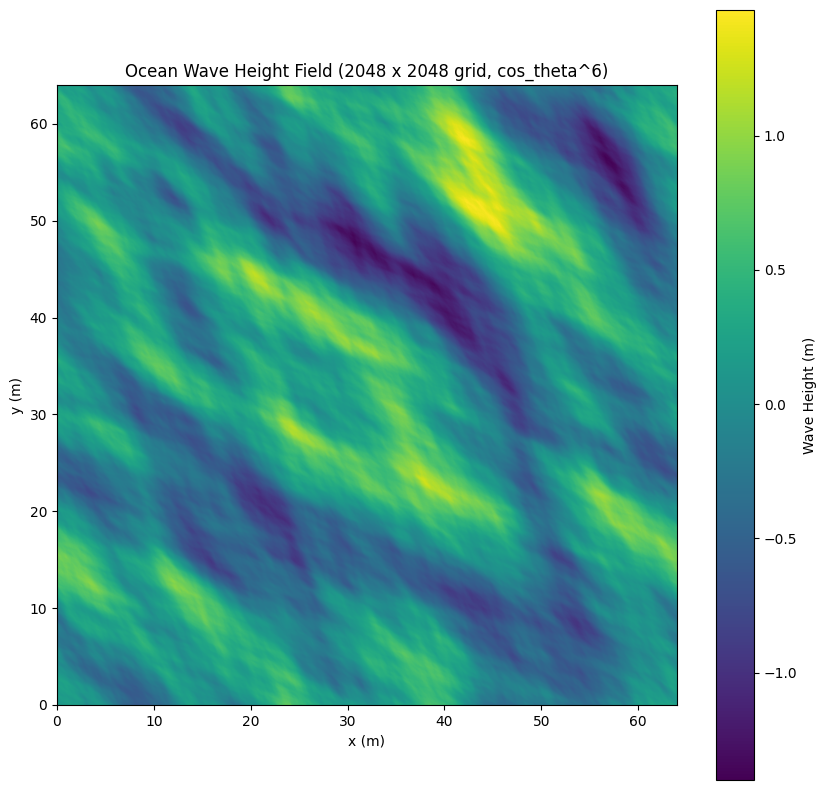

In [81]:
plt.figure(figsize=(10, 10))
plt.imshow(patch.height.numpy(), extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')
plt.colorbar(label='Wave Height (m)')
plt.title('Ocean Wave Height Field (2048 x 2048 grid, cos_theta^6)')
plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.show()

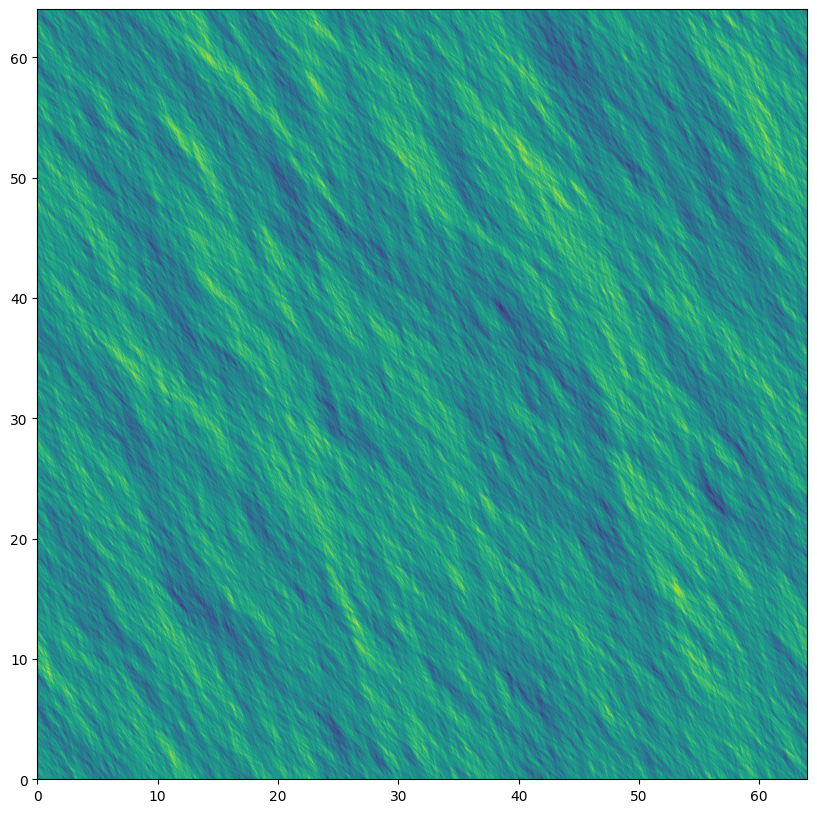

In [82]:
plt.figure(figsize=(10, 10))
plt.imshow(patch.metadata['height_grad'][..., 0].numpy(), extent=[0, Lx, 0, Lz], origin='lower', cmap='viridis')

In [ ]:
# import plotly.graph_objects as go

# fig = go.Figure(data=[go.Surface(z=patch.height.numpy())])
# fig.update_layout(scene=dict(zaxis=dict(range=[-5, max(Lx, Lz)])))
# fig.show()

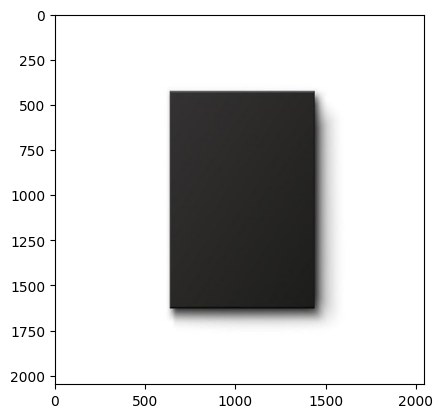

In [154]:
def load_image(name: str):
    image = Image.open(ASSETS_DIR / name)
    image = image.resize((M, N))
    image = torch.tensor(np.array(image)) / 255.0
    return image

image = load_image('box.jpg')
plt.imshow(image)

In [149]:
#image = torch.ones((H, W, 3))
depth = torch.full((M, N), 0.01) # 0.01 for caustics
light = torch.tensor([0, -1.0, 0])
light = light / torch.norm(light) * 2.0 # intensity
light_ambient = 0.05
light_scatter = 0.05
light_specular_mult = 0.85
light_specular_gain = 15.0
device = 'cuda'

In [150]:
image_bottom = generate_ocean_bottom_lightmap(
    patch, 
    image, 
    depth, 
    light, 
    light_ambient=light_ambient,
    light_scatter=light_scatter, 
    device=device
)

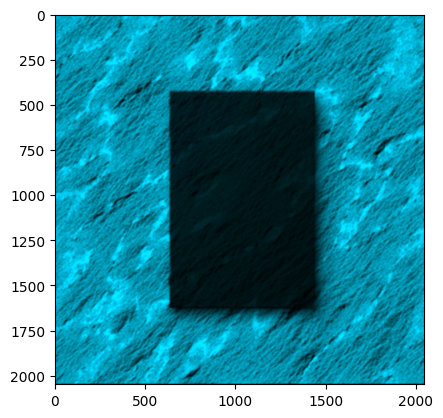

In [151]:
image_bottom = image_bottom.cpu().numpy()
plt.imshow(image_bottom)

In [152]:
image_corrupted = apply_corruption_ocean(
    patch, 
    image, 
    depth, 
    light, 
    light_ambient=light_ambient,
    light_scatter=light_scatter,
    light_specular_mult=light_specular_mult,
    light_specular_gain=light_specular_gain,
    device=device
)

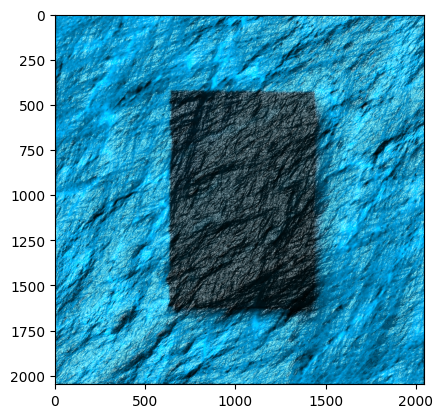

In [153]:
image_corrupted = image_corrupted.cpu().numpy()
plt.imshow(image_corrupted)

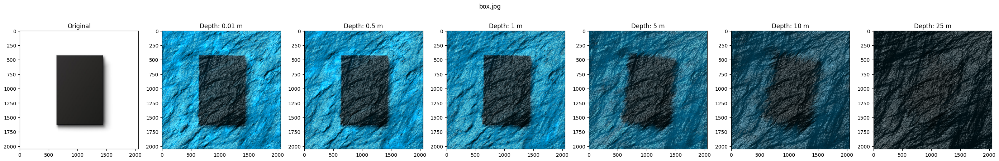

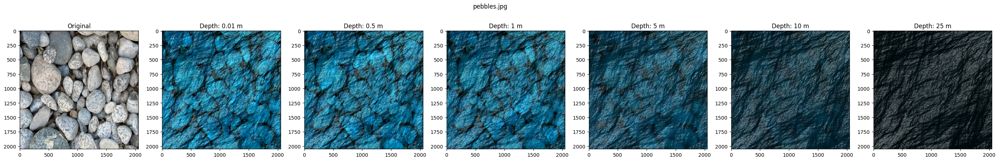

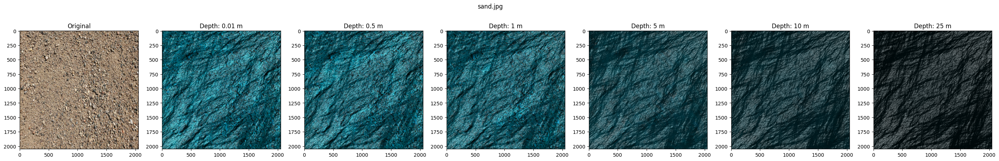

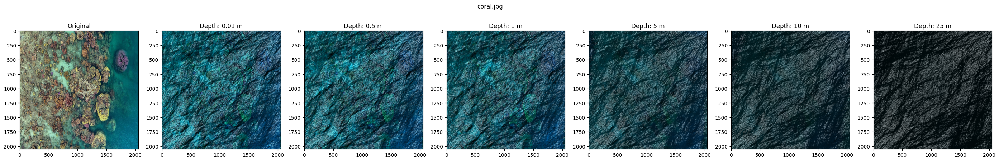

In [160]:
DEPTH_VALUES = [0.01, 0.5, 1, 5, 10, 25]

for name in ['box.jpg', 'pebbles.jpg', 'sand.jpg', 'coral.jpg']:
    image = load_image(name)
    image_corrupted_list = []
    for depth_value in DEPTH_VALUES:
        depth = torch.full((M, N), depth_value)
        image_corrupted = apply_corruption_ocean(
            patch, 
            image, 
            depth, 
            light, 
            light_ambient=light_ambient,
            light_scatter=light_scatter,
            light_specular_mult=light_specular_mult,
            light_specular_gain=light_specular_gain,
            device=device
        )
        image_corrupted = image_corrupted.cpu().numpy()
        image_corrupted_list.append(image_corrupted)
    plt.figure(figsize=(35, 5))
    plt.subplot(1, len(image_corrupted_list) + 1, 1)
    plt.imshow(image)
    plt.title('Original')
    for i, image_corrupted in enumerate(image_corrupted_list):
        plt.subplot(1, len(image_corrupted_list) + 1, i + 2)
        plt.imshow(image_corrupted)
        plt.title(f'Depth: {DEPTH_VALUES[i]} m')
    plt.suptitle(name)
    plt.show()